In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
import librosa as lr
import os


In [4]:
os.getcwd()

'C:\\Users\\devas\\Desktop\\music'

In [5]:
src = "C:\\Users\\devas\\Desktop\\music\\sample"
audio = glob(src + '/*.mp3')
type(audio)

list

In [6]:
audio[1]

'C:\\Users\\devas\\Desktop\\music\\sample\\music1.mp3'

In [7]:
sample1 ,sfreq = lr.load(audio[1])

In [8]:
import matplotlib.pyplot as plt

In [9]:
import IPython.display as ipd


In [10]:
ipd.Audio(audio[1])

In [11]:
type(sample1)

numpy.ndarray

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

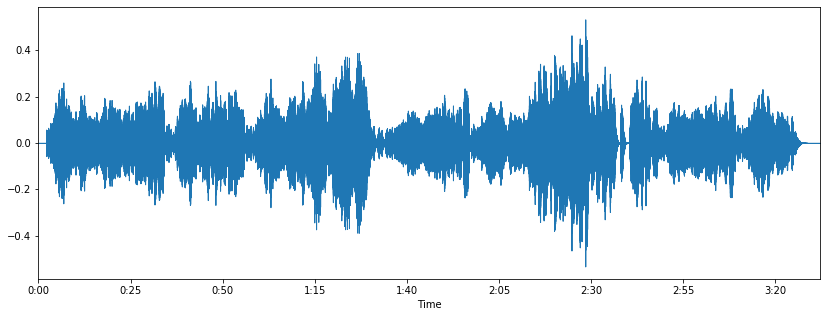

In [13]:
plt.figure(figsize=(14, 5))
lr.display.waveplot(sample1, sr=sfreq)

In [14]:
len(audio)

2

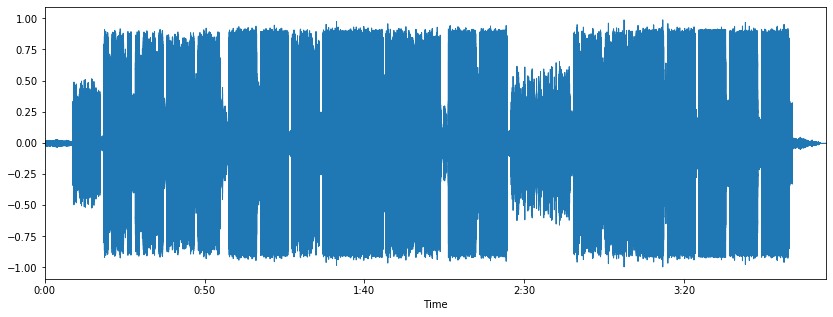

In [15]:
sample2 ,sfreq2 = lr.load(audio[0])
plt.figure(figsize = (14, 5))
lr.display.waveplot(sample2, sr=sfreq2)

In [16]:
type(sfreq2)
print(sfreq)

22050


In [17]:
ipd.Audio(audio[0])

In [18]:
d = np.abs(lr.stft(sample2))
d

array([[0.0000000e+00, 7.9525830e-07, 8.4104226e-04, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 7.9755142e-07, 2.3953838e-03, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 8.0425366e-07, 5.2320450e-03, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       ...,
       [0.0000000e+00, 2.9845757e-09, 8.5590337e-08, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 1.5074904e-09, 3.7973013e-08, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [0.0000000e+00, 3.1906877e-10, 3.5171628e-09, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)

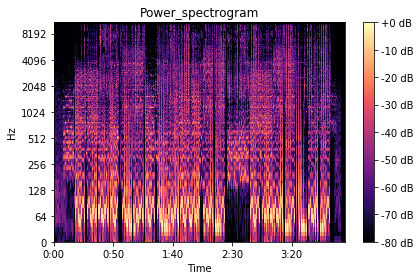

In [19]:
lr.display.specshow(lr.amplitude_to_db(d, ref = np.max),y_axis = 'log',x_axis='time')
plt.title('Power_spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()

In [20]:
d2 = np.abs(lr.stft(sample1))
d2

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

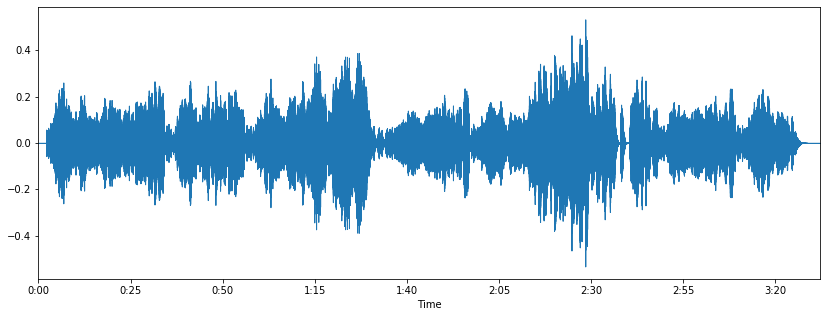

In [21]:
plt.figure(figsize=(14, 5))
lr.display.waveplot(sample1, sr=sfreq)

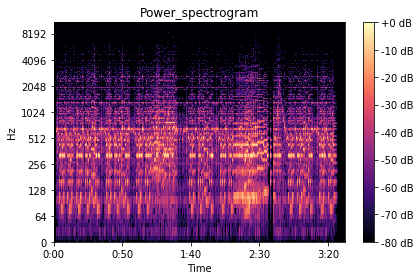

In [22]:
lr.display.specshow(lr.amplitude_to_db(d2, ref = np.max),y_axis = 'log',x_axis='time')
plt.title('Power_spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()

In [23]:
from sklearn.linear_model import OrthogonalMatchingPursuit
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.datasets import make_sparse_coded_signal

In [78]:
n_components, n_features = 512, 5389824
n_nonzero_coefs = 17

In [79]:
e = len(sample2)
print(e)

5389824


In [82]:
Y, X, w = make_sparse_coded_signal(n_samples=1,
                                   n_components=n_components,
                                   n_features=n_features,
                                   n_nonzero_coefs=n_nonzero_coefs,
                                   random_state=0)

MemoryError: 

In [73]:

omp = OrthogonalMatchingPursuit(17)


In [75]:
X.shape

(100, 512)

In [76]:
sample2.shape

(5389824,)

In [77]:
omp.fit(X,sample2)

ValueError: Found input variables with inconsistent numbers of samples: [100, 5389824]

S:\Anaconda3\envs\NLP\lib\site-packages\ipykernel_launcher.py:6: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


<StemContainer object of 3 artists>

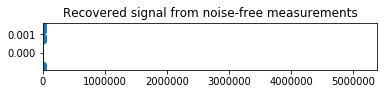

In [68]:
coef = omp.coef_
idx_r, = coef.nonzero()
plt.subplot(4, 1, 2)
plt.xlim(0, 5389824)
plt.title("Recovered signal from noise-free measurements")
plt.stem(idx_r, coef[idx_r])

In [69]:
idx_r

array([ 3,  7,  8, 17, 22, 29, 34, 43, 45, 47, 52, 60, 63, 68, 83, 95, 99],
      dtype=int64)